<a href="https://colab.research.google.com/github/Harsh064/Deep-Learning-Specialization-Projects/blob/master/Course5_Sequence_Models/Week4/UnGraded/Transformer_application_Named_Entity_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Named-Entity Recognition to process Resumes

* Use tokenizers and pre-trained models from the HuggingFace Library.
* Fine-tune a pre-trained transformer model for Named-Entity Recognition

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import json
import random
import logging
import re

tf.get_logger().setLevel('ERROR')

<a name='1'></a>
## 1 - Named-Entity Recogniton to Process Resumes


In this project we will find and classify relavent information such as the companies the applicant worked at, skills, type of degree, etc.

<a name='1-1'></a>
### 1.1 - Dataset Cleaning


In [ ]:
df_data['content'].iloc[0]

"Abhishek Jha\nApplication Development Associate - Accenture\n\nBengaluru, Karnataka - Email me on Indeed: indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a\n\n• To work for an organization which provides me the opportunity to improve my skills\nand knowledge for my individual and company's growth in best possible ways.\n\nWilling to relocate to: Bangalore, Karnataka\n\nWORK EXPERIENCE\n\nApplication Development Associate\n\nAccenture -\n\nNovember 2017 to Present\n\nRole: Currently working on Chat-bot. Developing Backend Oracle PeopleSoft Queries\nfor the Bot which will be triggered based on given input. Also, Training the bot for different possible\nutterances (Both positive and negative), which will be given as\ninput by the user.\n\nEDUCATION\n\nB.E in Information science and engineering\n\nB.v.b college of engineering and technology -  Hubli, Karnataka\n\nAugust 2013 to June 2017\n\n12th in Mathematics\n\nWoodbine modern school\n\nApril 2011 to March 2013\n\n10th\n\nKendriya Vidyalaya\n\

In [ ]:
df_data = pd.read_json("ner.json", lines=True)
df_data = df_data.drop(['extras'], axis=1)
df_data['content'] = df_data['content'].str.replace("\n", " ")

In [ ]:
df_data['content'].iloc[0]

"Abhishek Jha Application Development Associate - Accenture  Bengaluru, Karnataka - Email me on Indeed: indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a  • To work for an organization which provides me the opportunity to improve my skills and knowledge for my individual and company's growth in best possible ways.  Willing to relocate to: Bangalore, Karnataka  WORK EXPERIENCE  Application Development Associate  Accenture -  November 2017 to Present  Role: Currently working on Chat-bot. Developing Backend Oracle PeopleSoft Queries for the Bot which will be triggered based on given input. Also, Training the bot for different possible utterances (Both positive and negative), which will be given as input by the user.  EDUCATION  B.E in Information science and engineering  B.v.b college of engineering and technology -  Hubli, Karnataka  August 2013 to June 2017  12th in Mathematics  Woodbine modern school  April 2011 to March 2013  10th  Kendriya Vidyalaya  April 2001 to March 2011  SKILLS  C (Les

In [ ]:
df_data


,content,annotation
0,Abhishek Jha Application Development Associate...,"[{'label': ['Skills'], 'points': [{'start': 12..."
1,Afreen Jamadar Active member of IIIT Committee...,"[{'label': ['Email Address'], 'points': [{'sta..."
2,"Akhil Yadav Polemaina Hyderabad, Telangana - E...","[{'label': ['Skills'], 'points': [{'start': 37..."
3,Alok Khandai Operational Analyst (SQL DBA) Eng...,"[{'label': ['Skills'], 'points': [{'start': 80..."
4,Ananya Chavan lecturer - oracle tutorials Mum...,"[{'label': ['Degree'], 'points': [{'start': 20..."
...,...,...
215,"Mansi Thanki Student Jamnagar, Gujarat - Emai...","[{'label': ['College Name'], 'points': [{'star..."
216,Anil Kumar Microsoft Azure (Basic Management) ...,"[{'label': ['Location'], 'points': [{'start': ..."
217,Siddharth Choudhary Microsoft Office Suite - E...,"[{'label': ['Skills'], 'points': [{'start': 78..."
218,Valarmathi Dhandapani Investment Banking Opera...,"[{'label': ['Skills'], 'points': [{'start': 92..."


In [ ]:
df_data.head()

,content,annotation
0,Abhishek Jha Application Development Associate...,"[{'label': ['Skills'], 'points': [{'start': 12..."
1,Afreen Jamadar Active member of IIIT Committee...,"[{'label': ['Email Address'], 'points': [{'sta..."
2,"Akhil Yadav Polemaina Hyderabad, Telangana - E...","[{'label': ['Skills'], 'points': [{'start': 37..."
3,Alok Khandai Operational Analyst (SQL DBA) Eng...,"[{'label': ['Skills'], 'points': [{'start': 80..."
4,Ananya Chavan lecturer - oracle tutorials Mum...,"[{'label': ['Degree'], 'points': [{'start': 20..."


In [ ]:
df_data.iloc[0]['annotation']

[{'label': ['Skills'],
  'points': [{'start': 1295,
    'end': 1621,
    'text': '\n• Programming language: C, C++, Java\n• Oracle PeopleSoft\n• Internet Of Things\n• Machine Learning\n• Database Management System\n• Computer Networks\n• Operating System worked on: Linux, Windows, Mac\n\nNon - Technical Skills\n\n• Honest and Hard-Working\n• Tolerant and Flexible to Different Situations\n• Polite and Calm\n• Team-Player'}]},
 {'label': ['Skills'],
  'points': [{'start': 993,
    'end': 1153,
    'text': 'C (Less than 1 year), Database (Less than 1 year), Database Management (Less than 1 year),\nDatabase Management System (Less than 1 year), Java (Less than 1 year)'}]},
 {'label': ['College Name'],
  'points': [{'start': 939, 'end': 956, 'text': 'Kendriya Vidyalaya'}]},
 {'label': ['College Name'],
  'points': [{'start': 883, 'end': 904, 'text': 'Woodbine modern school'}]},
 {'label': ['Graduation Year'],
  'points': [{'start': 856, 'end': 860, 'text': '2017\n'}]},
 {'label': ['College 

In [ ]:
def mergeIntervals(intervals):
    sorted_by_lower_bound = sorted(intervals, key=lambda tup: tup[0])
    merged = []

    for higher in sorted_by_lower_bound:
        if not merged:
            merged.append(higher)
        else:
            lower = merged[-1]
            if higher[0] <= lower[1]:
                if lower[2] is higher[2]:
                    upper_bound = max(lower[1], higher[1])
                    merged[-1] = (lower[0], upper_bound, lower[2])
                else:
                    if lower[1] > higher[1]:
                        merged[-1] = lower
                    else:
                        merged[-1] = (lower[0], higher[1], higher[2])
            else:
                merged.append(higher)
    return merged

In [ ]:
def get_entities(df):

    entities = []

    for i in range(len(df)):
        entity = []

        for annot in df['annotation'][i]:
            try:
                ent = annot['label'][0]
                start = annot['points'][0]['start']
                end = annot['points'][0]['end'] + 1
                entity.append((start, end, ent))
            except:
                pass

        entity = mergeIntervals(entity)
        entities.append(entity)

    return entities

In [ ]:
df_data['entities'] = get_entities(df_data)
df_data.head()

,content,annotation,entities
0,Abhishek Jha Application Development Associate...,"[{'label': ['Skills'], 'points': [{'start': 12...","[(0, 12, Name), (13, 46, Designation), (49, 58..."
1,Afreen Jamadar Active member of IIIT Committee...,"[{'label': ['Email Address'], 'points': [{'sta...","[(0, 14, Name), (62, 68, Location), (104, 148,..."
2,"Akhil Yadav Polemaina Hyderabad, Telangana - E...","[{'label': ['Skills'], 'points': [{'start': 37...","[(0, 21, Name), (22, 31, Location), (65, 117, ..."
3,Alok Khandai Operational Analyst (SQL DBA) Eng...,"[{'label': ['Skills'], 'points': [{'start': 80...","[(0, 12, Name), (13, 51, Designation), (54, 60..."
4,Ananya Chavan lecturer - oracle tutorials Mum...,"[{'label': ['Degree'], 'points': [{'start': 20...","[(0, 13, Name), (14, 22, Designation), (24, 41..."


In [ ]:
df_data['entities'].iloc[0]

[(0, 12, 'Name'),
 (13, 46, 'Designation'),
 (49, 58, 'Companies worked at'),
 (60, 69, 'Location'),
 (95, 146, 'Email Address'),
 (372, 405, 'Designation'),
 (407, 416, 'Companies worked at'),
 (727, 770, 'Designation'),
 (771, 814, 'College Name'),
 (856, 861, 'Graduation Year'),
 (883, 905, 'College Name'),
 (939, 957, 'College Name'),
 (993, 1154, 'Skills'),
 (1295, 1622, 'Skills')]

In [ ]:
def convert_dataturks_to_spacy(dataturks_JSON_FilePath):
    try:
        training_data = []
        lines=[]
        with open(dataturks_JSON_FilePath, 'r') as f:
            lines = f.readlines()

        for line in lines:
            data = json.loads(line)
            text = data['content'].replace("\n", " ")
            entities = []
            data_annotations = data['annotation']
            if data_annotations is not None:
                for annotation in data_annotations:
                    #only a single point in text annotation.
                    point = annotation['points'][0]
                    labels = annotation['label']
                    # handle both list of labels or a single label.
                    if not isinstance(labels, list):
                        labels = [labels]

                    for label in labels:
                        point_start = point['start']
                        point_end = point['end']
                        point_text = point['text']

                        lstrip_diff = len(point_text) - len(point_text.lstrip())
                        rstrip_diff = len(point_text) - len(point_text.rstrip())
                        if lstrip_diff != 0:
                            point_start = point_start + lstrip_diff
                        if rstrip_diff != 0:
                            point_end = point_end - rstrip_diff
                        entities.append((point_start, point_end + 1 , label))
            training_data.append((text, {"entities" : entities}))
        return training_data
    except Exception as e:
        logging.exception("Unable to process " + dataturks_JSON_FilePath + "\n" + "error = " + str(e))
        return None

def trim_entity_spans(data: list) -> list:
    """Removes leading and trailing white spaces from entity spans.

    Args:
        data (list): The data to be cleaned in spaCy JSON format.

    Returns:
        list: The cleaned data.
    """
    invalid_span_tokens = re.compile(r'\s')

    cleaned_data = []
    for text, annotations in data:
        entities = annotations['entities']
        valid_entities = []
        for start, end, label in entities:
            valid_start = start
            valid_end = end
            while valid_start < len(text) and invalid_span_tokens.match(
                    text[valid_start]):
                valid_start += 1
            while valid_end > 1 and invalid_span_tokens.match(
                    text[valid_end - 1]):
                valid_end -= 1
            valid_entities.append([valid_start, valid_end, label])
        cleaned_data.append([text, {'entities': valid_entities}])
    return cleaned_data

In [ ]:
data = trim_entity_spans(convert_dataturks_to_spacy("ner.json"))

In [ ]:
text1="Abhishek Jha Application Development Associate - Accenture  Bengaluru, Karnataka - Email me on Indeed: indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a  • To work for an organization which provides me the opportunity to improve my skills and knowledge for my individual and company's growth in best possible ways.  Willing to relocate to: Bangalore, Karnataka  WORK EXPERIENCE  Application Development Associate  Accenture -  November 2017 to Present  Role: Currently working on Chat-bot. Developing Backend Oracle PeopleSoft Queries for the Bot which will be triggered based on given input. Also, Training the bot for different possible utterances (Both positive and negative), which will be given as input by the user.  EDUCATION  B.E in Information science and engineering  B.v.b college of engineering and technology -  Hubli, Karnataka  August 2013 to June 2017  12th in Mathematics  Woodbine modern school  April 2011 to March 2013  10th  Kendriya Vidyalaya  April 2001 to March 2011  SKILLS  C (Less than 1 year), Database (Less than 1 year), Database Management (Less than 1 year), Database Management System (Less than 1 year), Java (Less than 1 year)  ADDITIONAL INFORMATION  Technical Skills  https://www.indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a?isid=rex-download&ikw=download-top&co=IN   • Programming language: C, C++, Java • Oracle PeopleSoft • Internet Of Things • Machine Learning • Database Management System • Computer Networks • Operating System worked on: Linux, Windows, Mac  Non - Technical Skills  • Honest and Hard-Working • Tolerant and Flexible to Different Situations • Polite and Calm • Team-Player"

In [ ]:
text1[993:1154]

'C (Less than 1 year), Database (Less than 1 year), Database Management (Less than 1 year), Database Management System (Less than 1 year), Java (Less than 1 year)'

In [ ]:
len(text1.split())

227

In [ ]:
text1.split()

['Abhishek',
 'Jha',
 'Application',
 'Development',
 'Associate',
 '-',
 'Accenture',
 'Bengaluru,',
 'Karnataka',
 '-',
 'Email',
 'me',
 'on',
 'Indeed:',
 'indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a',
 '•',
 'To',
 'work',
 'for',
 'an',
 'organization',
 'which',
 'provides',
 'me',
 'the',
 'opportunity',
 'to',
 'improve',
 'my',
 'skills',
 'and',
 'knowledge',
 'for',
 'my',
 'individual',
 'and',
 "company's",
 'growth',
 'in',
 'best',
 'possible',
 'ways.',
 'Willing',
 'to',
 'relocate',
 'to:',
 'Bangalore,',
 'Karnataka',
 'WORK',
 'EXPERIENCE',
 'Application',
 'Development',
 'Associate',
 'Accenture',
 '-',
 'November',
 '2017',
 'to',
 'Present',
 'Role:',
 'Currently',
 'working',
 'on',
 'Chat-bot.',
 'Developing',
 'Backend',
 'Oracle',
 'PeopleSoft',
 'Queries',
 'for',
 'the',
 'Bot',
 'which',
 'will',
 'be',
 'triggered',
 'based',
 'on',
 'given',
 'input.',
 'Also,',
 'Training',
 'the',
 'bot',
 'for',
 'different',
 'possible',
 'utterances',
 '(Both',
 'p

In [ ]:
data

[["Abhishek Jha Application Development Associate - Accenture  Bengaluru, Karnataka - Email me on Indeed: indeed.com/r/Abhishek-Jha/10e7a8cb732bc43a  • To work for an organization which provides me the opportunity to improve my skills and knowledge for my individual and company's growth in best possible ways.  Willing to relocate to: Bangalore, Karnataka  WORK EXPERIENCE  Application Development Associate  Accenture -  November 2017 to Present  Role: Currently working on Chat-bot. Developing Backend Oracle PeopleSoft Queries for the Bot which will be triggered based on given input. Also, Training the bot for different possible utterances (Both positive and negative), which will be given as input by the user.  EDUCATION  B.E in Information science and engineering  B.v.b college of engineering and technology -  Hubli, Karnataka  August 2013 to June 2017  12th in Mathematics  Woodbine modern school  April 2011 to March 2013  10th  Kendriya Vidyalaya  April 2001 to March 2011  SKILLS  C (L

In [ ]:
from tqdm.notebook import tqdm
def clean_dataset(data):
    cleanedDF = pd.DataFrame(columns=["setences_cleaned"])
    sum1 = 0
    for i in tqdm(range(len(data))):
        start = 0
        emptyList = ["Empty"] * len(data[i][0].split())
        numberOfWords = 0
        lenOfString = len(data[i][0])
        strData = data[i][0]
        strDictData = data[i][1]
        lastIndexOfSpace = strData.rfind(' ')
        for i in range(lenOfString):
            if (strData[i]==" " and strData[i+1]!=" "):
                for k,v in strDictData.items():
                    for j in range(len(v)):
                        entList = v[len(v)-j-1]
                        if (start>=int(entList[0]) and i<=int(entList[1])):
                            emptyList[numberOfWords] = entList[2]
                            break
                        else:
                            continue
                start = i + 1
                numberOfWords += 1
            if (i == lastIndexOfSpace):
                for j in range(len(v)):
                        entList = v[len(v)-j-1]
                        if (lastIndexOfSpace>=int(entList[0]) and lenOfString<=int(entList[1])):
                            emptyList[numberOfWords] = entList[2]
                            numberOfWords += 1
        cleanedDF = cleanedDF.append(pd.Series([emptyList],  index=cleanedDF.columns ), ignore_index=True )
        sum1 = sum1 + numberOfWords
    return cleanedDF

In [ ]:
cleanedDF = clean_dataset(data)

  0%|          | 0/220 [00:00<?, ?it/s]

In [ ]:
type(cleanedDF)

pandas.core.frame.DataFrame

In [ ]:
cleanedDF.iloc[0][0]

['Name',
 'Name',
 'Designation',
 'Designation',
 'Designation',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Email Address',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Designation',
 'Designation',
 'Empty',
 'Companies worked at',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',
 'Empty',


In [ ]:
len(cleanedDF.iloc[0][0])

227

Take a look at your cleaned dataset and the categories the named-entities are matched to, or 'tags'.

In [ ]:
cleanedDF.head()

,setences_cleaned
0,"[Name, Name, Designation, Designation, Designa..."
1,"[Name, Name, Empty, Empty, Empty, Empty, Empty..."
2,"[Name, Name, Name, Empty, Empty, Empty, Empty,..."
3,"[Name, Name, Designation, Designation, Designa..."
4,"[Name, Name, Designation, Empty, Companies wor..."


In [ ]:
data[2][0].split()[:3] #Name, Name, Name

['Akhil', 'Yadav', 'Polemaina']

<a name='1-2'></a>
### 1.2 - Padding and Generating Tags

Now, it is time to generate a list of unique tags you will match the named-entities to.

In [ ]:
cleanedDF['setences_cleaned'].explode().unique()

array(['Name', 'Designation', 'Empty', 'Email Address',
       'Companies worked at', 'College Name', 'Skills', 'Degree',
       'Graduation Year', 'Location', 'Years of Experience', 'UNKNOWN'],
      dtype=object)

In [ ]:
unique_tags = set(cleanedDF['setences_cleaned'].explode().unique())#pd.unique(cleanedDF['setences_cleaned'])#set(tag for doc in cleanedDF['setences_cleaned'].values.tolist() for tag in doc)
tag2id = {tag: id for id, tag in enumerate(unique_tags)}
id2tag = {id: tag for tag, id in tag2id.items()}

In [ ]:
unique_tags

{'College Name',
 'Companies worked at',
 'Degree',
 'Designation',
 'Email Address',
 'Empty',
 'Graduation Year',
 'Location',
 'Name',
 'Skills',
 'UNKNOWN',
 'Years of Experience'}

In [ ]:
tag2id

{'Designation': 0,
 'College Name': 1,
 'Location': 2,
 'Name': 3,
 'Empty': 4,
 'UNKNOWN': 5,
 'Graduation Year': 6,
 'Degree': 7,
 'Companies worked at': 8,
 'Years of Experience': 9,
 'Email Address': 10,
 'Skills': 11}

In [ ]:
labels = cleanedDF['setences_cleaned'].values.tolist()
labels

[['Name',
  'Name',
  'Designation',
  'Designation',
  'Designation',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Email Address',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Designation',
  'Designation',
  'Empty',
  'Companies worked at',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'E

In [ ]:
[[tag2id.get(l) for l in lab] for lab in labels][0]

[3,
 3,
 0,
 0,
 0,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 10,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 0,
 0,
 4,
 8,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 0,
 0,
 0,
 0,
 0,
 4,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 1,
 1,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 1,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 4,
 4,
 4,
 4,
 4,
 4,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11]

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
MAX_LEN = 512
labels = cleanedDF['setences_cleaned'].values.tolist()

tags = pad_sequences([[tag2id.get(l) for l in lab] for lab in labels],
                     maxlen=MAX_LEN, value=tag2id["Empty"], padding="post",
                     dtype="long", truncating="post")

In [ ]:
tags

array([[ 3,  3,  0, ...,  4,  4,  4],
       [ 3,  3,  4, ...,  4,  4,  4],
       [ 3,  3,  3, ...,  4, 11,  4],
       ...,
       [ 3,  3,  0, ...,  4,  4,  4],
       [ 3,  3,  0, ...,  4,  4,  4],
       [ 3,  3,  0, ...,  4,  4,  4]])

In [ ]:
tags[0]

array([ 3,  3,  0,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4, 10,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  0,
        0,  4,  8,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        0,  0,  0,  0,  0,  4,  1,  1,  1,  1,  1,  1,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  1,  1,  4,  4,  4,  4,  4,  4,  4,  1,  4,
        4,  4,  4,  4,  4,  4, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,  4,
        4,  4,  4,  4,  4, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 11

<a name='1-3'></a>
### 1.3 - Tokenize and Align Labels with Library

* Tokenize the inputs using Transformer tokenizer
* Transformer model - DistilBERT fast tokenizer
* standardizes the length of your sequence to 512 and pads with zeros

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_virtual_device_configuration(gpu,[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)])

In [ ]:
from transformers import DistilBertTokenizerFast #, TFDistilBertModel
tokenizer = DistilBertTokenizerFast.from_pretrained('tokenizer/')


### tokenize_and_align_labels

* Maps the subtokens to the original word in the sentence and special tokens to None.
* Set the labels of all the special tokens (`None`) to -100 to prevent them from affecting the loss function.
* Label of the first subtoken of a word and set the label for the following subtokens to -100.

In [ ]:
label_all_tokens = True
def tokenize_and_align_labels(tokenizer, examples, tags):
    tokenized_inputs = tokenizer(examples, truncation=True, is_split_into_words=False, padding='max_length', max_length=512)
    labels = []
    for i, label in enumerate(tags):
        word_ids = tokenized_inputs.word_ids(batch_index=i)
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            # Special tokens have a word id that is None. We set the label to -100 so they are automatically
            # ignored in the loss function.
            if word_idx is None:
                label_ids.append(-100)
            # We set the label for the first token of each word.
            elif word_idx != previous_word_idx:
                label_ids.append(label[word_idx])
            # For the other tokens in a word, we set the label to either the current label or -100, depending on
            # the label_all_tokens flag.
            else:
                label_ids.append(label[word_idx] if label_all_tokens else -100)
            previous_word_idx = word_idx

        labels.append(label_ids)

    tokenized_inputs["labels"] = labels
    return tokenized_inputs

Creating train and test datasets

In [ ]:
test = tokenize_and_align_labels(tokenizer, df_data['content'].values.tolist(), tags)
train_dataset = tf.data.Dataset.from_tensor_slices((
    test['input_ids'],
    test['labels']
))

In [ ]:
test #len(test)=3

{'input_ids': [[101, 11113, 24158, 5369, 2243, 1046, 3270, 4646, 2458, 5482, 1011, 9669, 5397, 8191, 14129, 1010, 12092, 1011, 10373, 2033, 2006, 5262, 1024, 5262, 1012, 4012, 1013, 1054, 1013, 11113, 24158, 5369, 2243, 1011, 1046, 3270, 1013, 2184, 2063, 2581, 2050, 2620, 27421, 2581, 16703, 9818, 23777, 2050, 1528, 2000, 2147, 2005, 2019, 3029, 2029, 3640, 2033, 1996, 4495, 2000, 5335, 2026, 4813, 1998, 3716, 2005, 2026, 3265, 1998, 2194, 1005, 1055, 3930, 1999, 2190, 2825, 3971, 1012, 5627, 2000, 20102, 2000, 1024, 14022, 1010, 12092, 2147, 3325, 4646, 2458, 5482, 9669, 5397, 1011, 2281, 2418, 2000, 2556, 2535, 1024, 2747, 2551, 2006, 11834, 1011, 28516, 1012, 4975, 2067, 10497, 14721, 7243, 15794, 10861, 5134, 2005, 1996, 28516, 2029, 2097, 2022, 13330, 2241, 2006, 2445, 7953, 1012, 2036, 1010, 2731, 1996, 28516, 2005, 2367, 2825, 14395, 26755, 1006, 2119, 3893, 1998, 4997, 1007, 1010, 2029, 2097, 2022, 2445, 2004, 7953, 2011, 1996, 5310, 1012, 2495, 1038, 1012, 1041, 1999, 2592, 2

In [ ]:
test.keys()

dict_keys(['input_ids', 'attention_mask', 'labels'])

<a name='1-4'></a>
### 1.4 - Optimization


In [ ]:
unique_tags

{'College Name',
 'Companies worked at',
 'Degree',
 'Designation',
 'Email Address',
 'Empty',
 'Graduation Year',
 'Location',
 'Name',
 'Skills',
 'UNKNOWN',
 'Years of Experience'}

In [ ]:
from transformers import TFDistilBertForTokenClassification

model = TFDistilBertForTokenClassification.from_pretrained('model/', num_labels=len(unique_tags))

All model checkpoint layers were used when initializing TFDistilBertForTokenClassification.

All the layers of TFDistilBertForTokenClassification were initialized from the model checkpoint at model/.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertForTokenClassification for predictions without further training.


In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
model.compile(optimizer=optimizer, loss=model.hf_compute_loss, metrics=['accuracy']) # can also use any keras loss fn
model.fit(train_dataset.batch(4),
          epochs=10,
          batch_size=4)

Epoch 1/10
55/55 [==============================] - 14s 92ms/step - loss: 0.8300 - accuracy: 0.7073
Epoch 2/10
55/55 [==============================] - 5s 92ms/step - loss: 0.4829 - accuracy: 0.7537
Epoch 3/10
55/55 [==============================] - 5s 92ms/step - loss: 0.4533 - accuracy: 0.7537
Epoch 4/10
55/55 [==============================] - 5s 92ms/step - loss: 0.4256 - accuracy: 0.7599
Epoch 5/10
55/55 [==============================] - 5s 92ms/step - loss: 0.4011 - accuracy: 0.7621
Epoch 6/10
55/55 [==============================] - 5s 92ms/step - loss: 0.3817 - accuracy: 0.7640
Epoch 7/10
55/55 [==============================] - 5s 92ms/step - loss: 0.3673 - accuracy: 0.7648
Epoch 8/10
55/55 [==============================] - 5s 92ms/step - loss: 0.3571 - accuracy: 0.7652
Epoch 9/10
55/55 [==============================] - 5s 92ms/step - loss: 0.3420 - accuracy: 0.7677
Epoch 10/10
55/55 [==============================] - 5s 92ms/step - loss: 0.3231 - accuracy: 0.7714


In [ ]:
text = "Manisha Bharti. 3.5 years of professional IT experience in Banking and Finance domain"
inputs = tokenizer(text, return_tensors="tf", truncation=True, is_split_into_words=False, padding="max_length", max_length=512 )
input_ids = inputs["input_ids"]
#inputs["labels"] = tf.reshape(tf.constant([1] * tf.size(input_ids).numpy()), (-1, tf.size(input_ids)))

In [ ]:
inputs

{'input_ids': <tf.Tensor: shape=(1, 512), dtype=int32, numpy=
array([[  101, 23624,  7377,  1038, 10686,  2072,  1012,  1017,  1012,
         1019,  2086,  1997,  2658,  2009,  3325,  1999,  8169,  1998,
         5446,  5884,   102,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0, 

In [ ]:
output = model(inputs).logits
prediction = np.argmax(output, axis=2)
print( prediction)

[[3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 5 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4
  3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 4 4 3 3 3 3
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 3 3 3 3 3
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 4 4 4 4 4 4 4
  3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 3 3 3 3 3 4 4 4 4 4 4 4 4 4 3 3 3 3 3 4 3 3 3 3 4 4 4
  3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 4 4 3 3 3 3 3 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 

In [ ]:
output

<tf.Tensor: shape=(1, 512, 12), dtype=float32, numpy=
array([[[ 0.13131778, -0.10887519,  0.22292158, ..., -0.20855992,
          0.02244299,  0.01656215],
        [-0.04965133, -0.2929643 ,  0.04724457, ..., -0.2856011 ,
         -0.46200448,  0.27255118],
        [-0.0510789 , -0.57226914,  0.14450929, ..., -0.38781083,
         -0.42684713,  0.23370479],
        ...,
        [ 0.019476  , -0.3623505 , -0.30865827, ..., -0.31410438,
         -0.38658258,  0.10949816],
        [ 0.04835953, -0.2081569 , -0.25468123, ..., -0.32311502,
         -0.31022897,  0.11973646],
        [ 0.00988624, -0.3413918 , -0.23994374, ..., -0.3914796 ,
         -0.3988069 ,  0.1481006 ]]], dtype=float32)>

In [ ]:
model(inputs)

TFTokenClassifierOutput(loss=None, logits=<tf.Tensor: shape=(1, 512, 12), dtype=float32, numpy=
array([[[ 0.13131778, -0.10887519,  0.22292158, ..., -0.20855992,
          0.02244299,  0.01656215],
        [-0.04965133, -0.2929643 ,  0.04724457, ..., -0.2856011 ,
         -0.46200448,  0.27255118],
        [-0.0510789 , -0.57226914,  0.14450929, ..., -0.38781083,
         -0.42684713,  0.23370479],
        ...,
        [ 0.019476  , -0.3623505 , -0.30865827, ..., -0.31410438,
         -0.38658258,  0.10949816],
        [ 0.04835953, -0.2081569 , -0.25468123, ..., -0.32311502,
         -0.31022897,  0.11973646],
        [ 0.00988624, -0.3413918 , -0.23994374, ..., -0.3914796 ,
         -0.3988069 ,  0.1481006 ]]], dtype=float32)>, hidden_states=None, attentions=None)

In [ ]:
pred_labels = []

In [ ]:
!pip install seqeval

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 24.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for seqeval: filename=seqeval-1.2.2-py3-none-any.whl size=16166 sha256=db97e4567559571881ffd4381671dc67f8fc49b9f437be3b86cee4029ab5473d
  Stored in directory: /root/.cache/pip/wheels/e3/30/9b/6b670dac34775f2b7cc4e9b172202e81fbb4f9cdb103c1ca66
Successfully built seqeval

[notice] A new release of pip available: 22.3.1 -> 23.3.1
[notice] To update, run: python -m pip install --upgrade pip


In [ ]:
true_labels = [[id2tag.get(true_index, "Empty") for true_index in test['labels'][i]] for i in range(len(test['labels']))]
np.array(true_labels).shape

(220, 512)

In [ ]:
true_labels

[['Empty',
  'Name',
  'Name',
  'Name',
  'Name',
  'Name',
  'Name',
  'Designation',
  'Designation',
  'Designation',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Email Address',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Designation',
  'Designation',
  'Empty',
  'Companies worked at',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty

In [ ]:
len(true_labels)

220

In [ ]:
output = model.predict(train_dataset)

220/220 [==============================] - 2s 7ms/step


In [ ]:
predictions = np.argmax(output['logits'].reshape(220, -1, 12), axis=-1)

In [ ]:
predictions

array([[ 3,  3,  3, ..., 11, 11, 11],
       [ 3,  3,  3, ...,  4,  4,  4],
       [ 4,  3,  3, ...,  4,  4,  4],
       ...,
       [ 3,  3,  3, ...,  4,  4,  4],
       [ 3,  3,  3, ...,  4,  4,  4],
       [ 3,  3,  3, ...,  4,  4,  4]])

In [ ]:
predictions.shape

(220, 512)

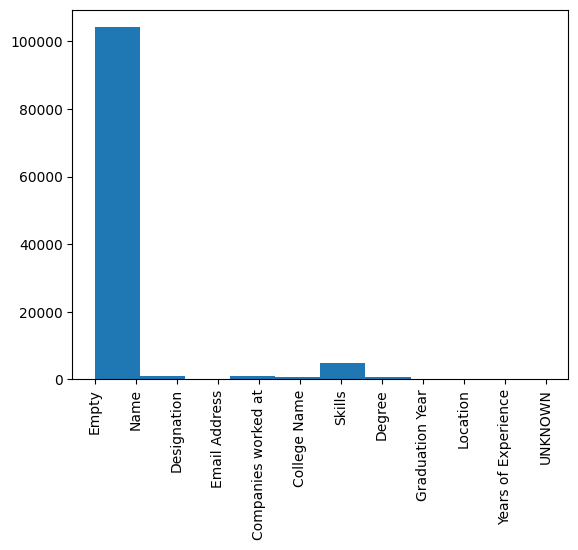

In [ ]:
from matplotlib import pyplot as plt

p = plt.hist(np.array(true_labels).flatten())
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
from collections import Counter
Counter(np.array(true_labels).flatten())

Counter({'Empty': 103155,
         'Name': 1035,
         'Designation': 1100,
         'Email Address': 76,
         'Companies worked at': 908,
         'College Name': 792,
         'Skills': 4704,
         'Degree': 598,
         'Graduation Year': 80,
         'Location': 116,
         'Years of Experience': 75,
         'UNKNOWN': 1})

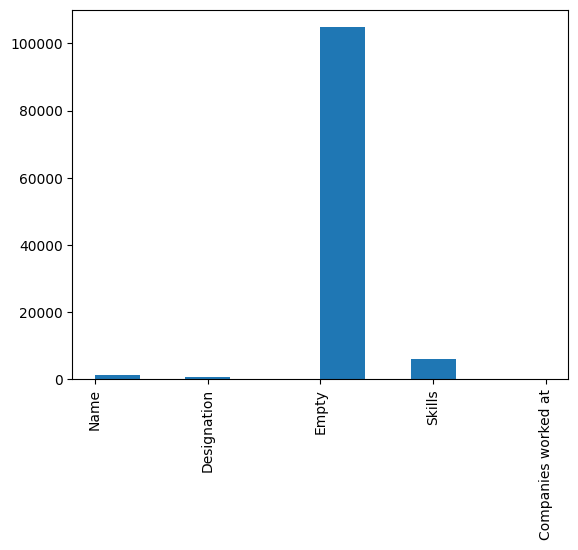

In [ ]:
pred_labels = [[id2tag.get(index, "Empty") for index in predictions[i]] for i in range(len(predictions))]
p = plt.hist(np.array(pred_labels).flatten())
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
Counter(np.array(pred_labels).flatten())

Counter({'Name': 1216,
         'Designation': 649,
         'Empty': 104808,
         'Skills': 5944,
         'Companies worked at': 23})

In [ ]:
pred_labels

[['Name',
  'Name',
  'Name',
  'Name',
  'Name',
  'Name',
  'Name',
  'Designation',
  'Designation',
  'Designation',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',
  'Empty',

In [ ]:
from seqeval.metrics import classification_report
print(classification_report(true_labels, pred_labels))

                    precision    recall  f1-score   support

            NKNOWN       0.00      0.00      0.00         1
               ame       0.21      0.21      0.21       220
ears of Experience       0.00      0.00      0.00        37
             egree       0.00      0.00      0.00       144
        esignation       0.40      0.19      0.26       430
             kills       0.49      0.62      0.55      4704
      mail Address       0.00      0.00      0.00        76
              mpty       0.95      0.97      0.96    103155
           ocation       0.00      0.00      0.00        73
       ollege Name       0.00      0.00      0.00       214
ompanies worked at       0.27      0.01      0.01       470
    raduation Year       0.00      0.00      0.00        58

         micro avg       0.93      0.94      0.93    109582
         macro avg       0.19      0.17      0.17    109582
      weighted avg       0.92      0.94      0.93    109582

